In [1]:
import tensorflow as tf
from tensorflow import keras

Reference Paper: "Designing Network Design Spaces"

- Network:
 - stem
 - body 
 - head
 
- body:
 - stage1
 - stage2
 - stage3
 - stage4
 
- stagei
 - block1
 - block2
 - block3
 - ...
 - blockdi
 
- stem
 - 3x3 Conv stride=2 filters=w0 (32)
 
- head 
 - AvgPool
 - Dense units=n (for n classes)

- stage parameter
 - number of blocks **di**

- block parameters
 - width **wi**
 - bottleneck ration **bi**
 - group width **gi**
 

- All the blocks are identical except the first block
- The first block uses stride=2 Conv.
- wi refers to number of channels (in a block)
- r,r refers resolution/ width and height of feature map outputs
- body contains only 4 stages  


In [2]:
def X_block_s1(x, wi, bi, gi):
    
    x1 = tf.keras.layers.Conv2D(wi//bi, 
                                kernel_size=1,
                                strides=(1, 1),
                                groups=1, 
                                activation=None,
                                kernel_initializer='glorot_uniform')(x)

    x2 = tf.keras.layers.BatchNormalization()(x1)
    x3 = tf.keras.layers.Activation('relu')(x2)

    x4 = tf.keras.layers.Conv2D(wi//bi, 
                                kernel_size=3,
                                strides=(1, 1),
                                padding='same',
                                groups=gi, 
                                activation=None,
                                kernel_initializer='glorot_uniform')(x3)

    x5 = tf.keras.layers.BatchNormalization()(x4)
    x6 = tf.keras.layers.Activation('relu')(x5)

    x7 = tf.keras.layers.Conv2D(wi, 
                                kernel_size=1,
                                strides=(1, 1),
                                groups=1, 
                                activation=None,
                                kernel_initializer='glorot_uniform')(x6)

    x8 = tf.keras.layers.BatchNormalization()(x7)
    x9 = tf.keras.layers.Activation('relu')(x8)

    x10 = tf.keras.layers.Add()([x, x9])

    return x10


In [3]:
def X_block_s2(x, wi,bi,gi):
    
    x1 = tf.keras.layers.Conv2D(wi//bi,
                                kernel_size=1,
                                strides=(1, 1),
                                groups=1,
                                activation=None,
                                kernel_initializer='glorot_uniform')(x)

    x2 = tf.keras.layers.BatchNormalization()(x1)
    x3 = tf.keras.layers.Activation('relu')(x2)

    x4 = tf.keras.layers.Conv2D(wi//bi, 
                                kernel_size=3,
                                strides=(2, 2),
                                padding='same',
                                groups=gi, 
                                activation=None,
                                kernel_initializer='glorot_uniform')(x3)

    x5 = tf.keras.layers.BatchNormalization()(x4)
    x6 = tf.keras.layers.Activation('relu')(x5)

    x7 = tf.keras.layers.Conv2D(wi, 
                                kernel_size=1,
                                strides=(1, 1),
                                groups=1, 
                                activation=None,
                                kernel_initializer='glorot_uniform')(x6)

    x8 = tf.keras.layers.BatchNormalization()(x7)
    x9 = tf.keras.layers.Activation('relu')(x8)

    x1_2 = tf.keras.layers.Conv2D(wi,
                                  kernel_size=1,
                                  strides=(2, 2),
                                  groups=1,
                                  activation=None,
                                  kernel_initializer='glorot_uniform')(x)

    x2_2 = tf.keras.layers.BatchNormalization()(x1_2)
    x3_2 = tf.keras.layers.Activation('relu')(x2_2)

    x10 = tf.keras.layers.Add()([x9, x3_2])

    return x10


- AnyNetXa:
 - any possible model within its parameters combinations
 
- AnyNetXb:
 - bottleneck ratio **bi** is fixed across all stages
 
- AnyNetXc:
 - group width **gi** is fixed across all stages
 
- AnyNetXd:
 - stage width wi+1 is greater than previous width wi
 
- AnyNetXe:
 - stage depth di+1 is greater than previous depth di
 
- RegNet:
 - per block width wj, where j is index of blocks. 
 - observations:
   - found that good models in design space have linear fit for block width wj with their position j
   - wj = 48*(j+1) for 0<=j<=20
 - Proposed approach:
   - d total depth, j index of block position
   - uj = w0 + wa*j  for 0<=j<d (Eqn1)
   - w0 is initial width (>0)
   - wa slope (>0)
   - we introduce another additional parameter wm (>0)
   - given uj, wm now find value of sj such that it satisfies the following eqn
   - uj = w0* (wm)**sj (Eq2)
   - compute sj for each block j
   - to quantize wj we round off sj
   - i.e. [sj] (rounded off)
   - Now we compute per block width wj by
   - wj = w0* (wm)**[sj] (Eqn3)
  - 6 parameters:
    - d, w0, wa, wm, b, g
  - Sampled models have constraints:
    - d < 64
    - w0, wa < 256
    - 1.5 <= wm <= 3
    - b <= 2
    - g > 1
   - good model observed parameters:
     - wm =2 
     - w0 = wa
     - observation that the third stage has higher number of blocks whereas the last stage has smaller number of blocks.
     - g increases with more large models, whereas the d saturates for large models.
 - RegNetX-200MF
     - di = [1,1,4,7]
     - wi = [24,56,152,368]
     - g = 8
     - b = 1
     - wa = 36, w0 = 24, wm =2.5
     - 2.7 Million Parameters
     - error rate 30.8%
 - RegNetX-400MF
     - di = [1,2,7,12]
     - wi = [32,64,160,384]
     - g = 16
     - b = 1
     - wa = 24, w0 = 24, wm =2.5
     - 5.2 Million Parameters
     - error rate 27.2%
 - RegNetX-600MF
     - di = [1,3,5,7]
     - wi = [48,96,240,528]
     - g = 24
     - b = 1
     - wa = 37, w0 = 48, wm =2.2
     - 6.2 Million Parameters
     - error rate 25.5%
 - RegNetX-800MF
     - di = [1,3,7,5]
     - wi = [64,128,288,672]
     - g = 16
     - b = 1
     - wa = 36, w0 = 56, wm =2.3
     - 7.3 Million Parameters
     - error rate 24.8%


In [4]:
def stem(x, w0):
    x1 = tf.keras.layers.Conv2D(w0,
                               kernel_size=1,
                               strides=(2, 2),
                               groups=1,
                               activation=None,
                               kernel_initializer='glorot_uniform')(x)

    x2 = tf.keras.layers.BatchNormalization()(x1)
    x3 = tf.keras.layers.Activation('relu')(x2)

    return x3

In [5]:
# check this again
def head(x, units, activation):
        #x1 = tf.keras.layers.AveragePooling2D(pool_size=(2, 2), strides=None)(x)
        x1 = tf.keras.layers.GlobalAveragePooling2D()(x)
        x2 = tf.keras.layers.Dense(units=units, 
                                   activation=activation,
                                   kernel_initializer='glorot_uniform')(x1)
        return x2

In [6]:
def stage1(x, di, wi, bi, gi):
    x = X_block_s2(x, wi,bi,gi)
    for i in range(2, di+1):
        x = X_block_s1(x, wi, bi, gi)
    return x

def stage2(x, di, wi, bi, gi):
    x = X_block_s2(x, wi,bi,gi)
    for i in range(2, di+1):
        x = X_block_s1(x, wi, bi, gi)
    return x

def stage3(x, di, wi, bi, gi):
    x = X_block_s2(x, wi,bi,gi)
    for i in range(2, di+1):
        x = X_block_s1(x, wi, bi, gi)
    return x

def stage4(x, di, wi, bi, gi):
    x = X_block_s2(x, wi,bi,gi)
    for i in range(2, di+1):
        x = X_block_s1(x, wi, bi, gi)
    return x

In [7]:
def RegNetX_200MF(x):
    """
        di = [1,1,4,7]
        wi = [24,56,152,368]
        g = 8
        b = 1
        wa = 36, w0 = 24, wm =2.5
        2.7 Million Parameters
        error rate 30.8%
        
    """
    # stem
    x = stem(x, w0=24)
    
    # body
    x = stage1(x, di=1, wi=24, bi=1, gi=8)
    x = stage2(x, di=1, wi=56, bi=1, gi=8)
    x = stage3(x, di=4, wi=152, bi=1, gi=8)
    x = stage4(x, di=7, wi=368, bi=1, gi=8)
    
    return x
    

In [8]:
def RegNetX_400MF(x):
    """
        di = [1,2,7,12]
        wi = [32,64,160,384]
        g = 16
        b = 1
        wa = 24, w0 = 24, wm =2.5
        5.2 Million Parameters
        error rate 27.2%
        
    """
    # stem
    x = stem(x, w0=24)
    
    # body
    x = stage1(x, di=1, wi=32, bi=1, gi=16)
    x = stage2(x, di=2, wi=64, bi=1, gi=16)
    x = stage3(x, di=7, wi=160, bi=1, gi=16)
    x = stage4(x, di=12, wi=384, bi=1, gi=16)
    
    return x
    

In [9]:
def RegNetX_600MF(x):
    """
        di = [1,3,5,7]
        wi = [48,96,240,528]
        g = 24
        b = 1
        wa = 37, w0 = 48, wm =2.2
        6.2 Million Parameters
        error rate 25.5%
        
    """
    # stem
    x = stem(x, w0=48)
    
    # body
    x = stage1(x, di=1, wi=48, bi=1, gi=24)
    x = stage2(x, di=3, wi=96, bi=1, gi=24)
    x = stage3(x, di=5, wi=240, bi=1, gi=24)
    x = stage4(x, di=7, wi=528, bi=1, gi=24)
    
    return x
    

In [10]:
def RegNetX_800MF(x):
    """
        di = [1,3,7,5]
        wi = [64,128,288,672]
        g = 16
        b = 1
        wa = 36, w0 = 56, wm =2.3
        7.3 Million Parameters
        error rate 24.8%
        
    """
    # stem
    x = stem(x, w0=56)
    
    # body
    x = stage1(x, di=1, wi=64, bi=1, gi=16)
    x = stage2(x, di=3, wi=128, bi=1, gi=16)
    x = stage3(x, di=7, wi=288, bi=1, gi=16)
    x = stage4(x, di=5, wi=672, bi=1, gi=16)
    
    return x
    

In [11]:
img_height,img_width,channel = 224,224,3

In [12]:
inputs = tf.keras.Input(shape=(img_height, img_width, channel))

x = RegNetX_200MF(inputs)

outputs = head(x, units=1000, activation='softmax')

# Using Functional API to construct the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

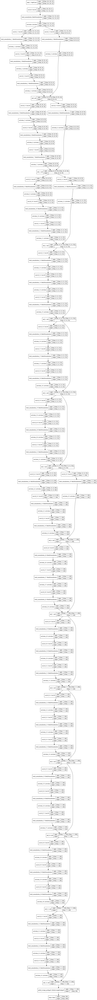

In [13]:
# Plotting the model image
keras.utils.plot_model(model, "RegNetX_200MF.png", show_shapes=True)

In [14]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 112, 112, 24) 96          input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 112, 112, 24) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 112, 112, 24) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [15]:
inputs = tf.keras.Input(shape=(img_height, img_width, channel))

x = RegNetX_400MF(inputs)

outputs = head(x, units=1000, activation='softmax')

# Using Functional API to construct the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

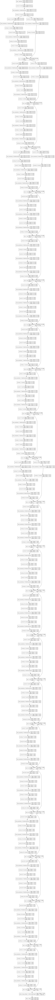

In [16]:
# Plotting the model image
keras.utils.plot_model(model, "RegNetX_400MF.png", show_shapes=True)

In [17]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_44 (Conv2D)              (None, 112, 112, 24) 96          input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_44 (BatchNo (None, 112, 112, 24) 96          conv2d_44[0][0]                  
__________________________________________________________________________________________________
activation_44 (Activation)      (None, 112, 112, 24) 0           batch_normalization_44[0][0]     
____________________________________________________________________________________________

In [18]:
inputs = tf.keras.Input(shape=(img_height, img_width, channel))

x = RegNetX_600MF(inputs)

outputs = head(x, units=1000, activation='softmax')

# Using Functional API to construct the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

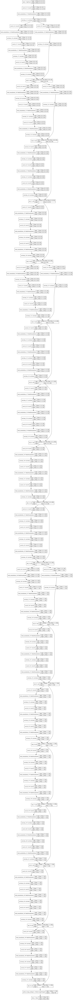

In [19]:
# Plotting the model image
keras.utils.plot_model(model, "RegNetX_600MF.png", show_shapes=True)

In [20]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_115 (Conv2D)             (None, 112, 112, 48) 192         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_115 (BatchN (None, 112, 112, 48) 192         conv2d_115[0][0]                 
__________________________________________________________________________________________________
activation_115 (Activation)     (None, 112, 112, 48) 0           batch_normalization_115[0][0]    
____________________________________________________________________________________________

In [21]:
inputs = tf.keras.Input(shape=(img_height, img_width, channel))

x = RegNetX_800MF(inputs)

outputs = head(x, units=1000, activation='softmax')

# Using Functional API to construct the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

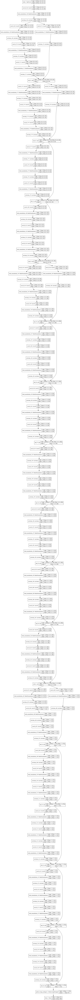

In [22]:
# Plotting the model image
keras.utils.plot_model(model, "RegNetX_800MF.png", show_shapes=True)

In [23]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_168 (Conv2D)             (None, 112, 112, 56) 224         input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_168 (BatchN (None, 112, 112, 56) 224         conv2d_168[0][0]                 
__________________________________________________________________________________________________
activation_168 (Activation)     (None, 112, 112, 56) 0           batch_normalization_168[0][0]    
____________________________________________________________________________________________

In [25]:
import numpy as np

def generate_regnet(w_a, w_0, w_m, d, q=8):
    """Generates per stage widths and depths from RegNet parameters."""
    assert w_a >= 0 and w_0 > 0 and w_m > 1 and w_0 % q == 0
    # Generate continuous per-block ws
    ws_cont = np.arange(d) * w_a + w_0
    # Generate quantized per-block ws
    ks = np.round(np.log(ws_cont / w_0) / np.log(w_m))
    ws_all = w_0 * np.power(w_m, ks)
    ws_all = np.round(np.divide(ws_all, q)).astype(int) * q
    # Generate per stage ws and ds (assumes ws_all are sorted)
    ws, ds = np.unique(ws_all, return_counts=True)
    # Compute number of actual stages and total possible stages
    num_stages, total_stages = len(ws), ks.max() + 1
    # Convert numpy arrays to lists and return
    ws, ds, ws_all, ws_cont = (x.tolist() for x in (ws, ds, ws_all, ws_cont))
    return ws, ds, num_stages, total_stages, ws_all, ws_cont

In [28]:
generate_regnet(w_a = 36, w_0 = 24, w_m =2.5, d=7)

([24, 64, 152, 376],
 [1, 1, 4, 1],
 4,
 4.0,
 [24, 64, 152, 152, 152, 152, 376],
 [24, 60, 96, 132, 168, 204, 240])

In [ ]:
[24,56,152,368]

In [39]:
def generate_regnet_full():
    """Generates per stage ws, ds, gs, bs, and ss from RegNet cfg."""
    w_a, w_0, w_m, d = 36, 24, 2.5, 7
    ws, ds = generate_regnet(w_a, w_0, w_m, d)[0:2]
    ss = [1 for _ in ws]
    bs = [1 for _ in ws]
    gs = [8 for _ in ws]
    ws, bs, gs = adjust_block_compatibility(ws, bs, gs)
    return ws, ds, ss, bs, gs

def adjust_block_compatibility(ws, bs, gs):
    """Adjusts the compatibility of widths, bottlenecks, and groups."""
    assert len(ws) == len(bs) == len(gs)
    assert all(w > 0 and b > 0 and g > 0 for w, b, g in zip(ws, bs, gs))
    assert all(b < 1 or b % 1 == 0 for b in bs)
    vs = [int(max(1, w * b)) for w, b in zip(ws, bs)]
    gs = [int(min(g, v)) for g, v in zip(gs, vs)]
    ms = [np.lcm(g, int(b)) if b > 1 else g for g, b in zip(gs, bs)]
    vs = [max(m, int(round(v / m) * m)) for v, m in zip(vs, ms)]
    ws = [int(v / b) for v, b in zip(vs, bs)]
    assert all(w * b % g == 0 for w, b, g in zip(ws, bs, gs))
    return ws, bs, gs

In [40]:
generate_regnet_full()

([24, 64, 152, 376], [1, 1, 4, 1], [1, 1, 1, 1], [1, 1, 1, 1], [8, 8, 8, 8])